In [1]:
import loompy
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import os
from cytograph.pipeline import load_config, PunchcardDeck
from cytograph.plotting import colorize
from cytograph.embedding import art_of_tsne
from cytograph.visualization import scatterm
from cytograph.species import Species
from urllib.request import urlretrieve
from sknetwork.hierarchy import cut_straight
import scipy.cluster.hierarchy as hc
import numpy_groupies as npg
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist
from scipy import sparse
import seaborn
import matplotlib as mpl
import gget
import pickle
import networkx as nx

# suppress INFO
import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)

# make font changeable in Illustrator
mpl.rcParams['pdf.fonttype'] = 42

# save figure with no pad
mpl.rcParams['savefig.pad_inches'] = 0
mpl.rcParams['savefig.bbox'] = 'tight'

# set axes width
mpl.rcParams['axes.linewidth'] = 0.2
mpl.rcParams['xtick.minor.pad'] = 0
mpl.rcParams['xtick.major.pad'] = 0
mpl.rcParams['ytick.minor.pad'] = 0
mpl.rcParams['ytick.major.pad'] = 0
mpl.rcParams['xtick.minor.width'] = 0.2
mpl.rcParams['xtick.major.width'] = 0.2
mpl.rcParams['ytick.minor.width'] = 0.2
mpl.rcParams['ytick.major.width'] = 0.2

# use colorblind seaborn style
plt.style.use('seaborn-colorblind')

# colors for ROI Groups
color_dict = dict(
    zip(
        ["Cerebral cortex", "Hippocampus", "Cerebral nuclei", "Hypothalamus", "Thalamus", "Midbrain", "Pons", "Cerebellum", "Myelencephalon", "Spinal cord"],
        ['#4682f0', '#8eb7d1', '#89d8e0', '#f28e37', '#e7bc1f', '#43ad78', '#a7236e', '#ed5f8e', '#955ba5', '#eec2a4']
    )
)

In [2]:
folder = '/proj/human_adult/20220222/harmony/paris_top_bug/data/'
figure_folder = '/home/kimberly/figures/figure6'

In [3]:
# get ncRNA gene names
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    accession_dict = dict(zip(
        pd.Series(ds.ra.Accession).str.split('.').str[0],
        np.arange(ds.shape[0])
    ))
    ncRNA_genes = np.loadtxt('ncRNA.txt', dtype='object')
    accession_ix = np.array([accession_dict.get(x, '') for x in ncRNA_genes])
    accession_ix = accession_ix[accession_ix != ''].astype('int')
    ncRNA_genes = ds.ra.Gene[accession_ix]

In [4]:
cbl = seaborn.color_palette('colorblind')
cbl

[(0.00392156862745098, 0.45098039215686275, 0.6980392156862745),
 (0.8705882352941177, 0.5607843137254902, 0.0196078431372549),
 (0.00784313725490196, 0.6196078431372549, 0.45098039215686275),
 (0.8352941176470589, 0.3686274509803922, 0.0),
 (0.8, 0.47058823529411764, 0.7372549019607844),
 (0.792156862745098, 0.5686274509803921, 0.3803921568627451),
 (0.984313725490196, 0.6862745098039216, 0.8941176470588236),
 (0.5803921568627451, 0.5803921568627451, 0.5803921568627451),
 (0.9254901960784314, 0.8823529411764706, 0.2),
 (0.33725490196078434, 0.7058823529411765, 0.9137254901960784)]

In [5]:
def go_plot(table, n_top=25, filename=None):
    
    top = table.sort_values('adj_p_val')[:n_top][::-1]
    
    plt.figure(None, (1, 3))
    
    ax = plt.subplot(122)
    plt.barh(range(n_top), top['adj_p_val'].to_numpy(), color='grey', alpha=0.3)
    plt.vlines(0.05, -0.5, n_top-0.5, linestyles='dashed', colors=cbl[2])
    ax.spines.right.set_visible(False)
    ax.spines.top.set_visible(False)
    plt.yticks([])
    plt.xticks(np.round(np.linspace(0, top['adj_p_val'].max(), 4), 2), rotation=90, fontsize=7)
    plt.margins(y=0.01)
    
    ax = plt.subplot(121)
    n_genes = top['overlapping_genes'].str.len().to_numpy()
    plt.barh(range(n_top), -n_genes, alpha=0.3, color='grey')
    ax.spines.left.set_visible(False)
    ax.spines.top.set_visible(False)
    plt.yticks(range(n_top), top['path_name'].str.split('(').str[0].str.strip(), fontsize=9)
    plt.xticks(
        -np.linspace(0, n_genes.max(), 4),
        np.round(np.linspace(0, n_genes.max(), 4), 2),
        rotation=90,
        fontsize=7
    )
    plt.margins(y=0.01)
    if filename:
        plt.savefig(filename, dpi=300)
    else:
        plt.show()

In [6]:
def skeletonize(nn, groups, labels, min_pct=1):
    
    row = []
    col = []
    weight = []
    
    for i, c1 in enumerate(groups):
        n_c1 = (labels == c1).sum()
        rc1 = labels[nn.row] == c1
        cc1 = labels[nn.col] == c1
        c1_internal = (rc1 & cc1).sum()
        for j, c2 in enumerate(groups):
            n_c2 = (labels == c2).sum()
            rc2 = labels[nn.row] == c2
            cc2 = labels[nn.col] == c2
            c2_internal = (rc2 & cc2).sum()
            c1c2_between = ((rc1 & cc2) | (rc2 & cc1)).sum()
            f = n_c1 / (n_c1 + n_c2)
            expected_fraction = (2 * f - 2 * f**2)
            observed_fraction = c1c2_between / (c1_internal + c2_internal + c1c2_between)
            # if observed_fraction > expected_fraction * (self.min_pct / 100):
            if observed_fraction > (min_pct / 100):
                row.append(i)
                col.append(j)
                weight.append(observed_fraction / expected_fraction)
                
    # make matrix of edges            
    n_clusters = len(groups)
    overlap = sparse.coo_matrix((weight, (row, col)), shape=(n_clusters, n_clusters)).A
    
    # remove edges within a group
    np.fill_diagonal(overlap, 0)
    
    return overlap

In [7]:
def clean_roi(roi_attr):
    return pd.Series(roi_attr).replace({r'[^\x00-\x7F]+':''}, regex=True).to_numpy()

# What genes vary across astrocytes?

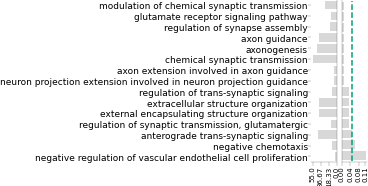

In [26]:
with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:
    top_genes = ds.ra.Gene[ds.ra.Selected == 1]
    df = gget.enrichr(top_genes, database="ontology")
    go_plot(df, n_top=15, filename=f'{figure_folder}/top_variable_GO.pdf')

In [27]:
df[:20]

,rank,path_name,p_val,z_score,combined_score,overlapping_genes,adj_p_val,database
0,1,modulation of chemical synaptic transmission (...,0.000002,3.141086,41.016507,"[CX3CR1, NLGN1, MCTP1, CLSTN2, CACNA1B, GRIK3,...",0.007847,GO_Biological_Process_2021
1,2,glutamate receptor signaling pathway (GO:0007215),0.000006,5.509830,65.961624,"[GRID2, GRIK3, GRIK1, GRIK2, GRIN2B, GRM1, GRM...",0.007847,GO_Biological_Process_2021
2,3,regulation of synapse assembly (GO:0051963),0.000007,4.674558,55.539276,"[ROBO2, NLGN1, GRID2, CLSTN2, MUSK, PTPRD, LRF...",0.007847,GO_Biological_Process_2021
3,4,axon guidance (GO:0007411),0.000009,2.304520,26.686927,"[ROBO2, SEMA5A, NRP1, NRP2, LAMA2, SEMA3C, SEM...",0.007847,GO_Biological_Process_2021
4,5,axonogenesis (GO:0007409),0.000012,2.160717,24.534833,"[ROBO2, SEMA5A, NRP1, NRP2, LAMA2, SEMA3C, SEM...",0.007847,GO_Biological_Process_2021
5,6,chemical synaptic transmission (GO:0007268),0.000013,1.999601,22.567363,"[GABRB3, CHRM2, GABRB2, CHRM3, SNAP25, GRIK3, ...",0.007847,GO_Biological_Process_2021
6,7,axon extension involved in axon guidance (GO:0...,0.000023,27.078235,288.888446,"[NRP1, NRP2, SEMA3A, SLIT1, SLIT3, SLIT2]",0.010910,GO_Biological_Process_2021
7,8,neuron projection extension involved in neuron...,0.000023,27.078235,288.888446,"[NRP1, NRP2, SEMA3A, SLIT1, SLIT3, SLIT2]",0.010910,GO_Biological_Process_2021
8,9,regulation of trans-synaptic signaling (GO:009...,0.000090,4.717960,43.960992,"[CX3CR1, NLGN1, GRID2, ARC, RELN, NLGN4X, FABP...",0.032723,GO_Biological_Process_2021
9,10,extracellular structure organization (GO:0043062),0.000093,2.066790,19.176364,"[FBN2, LAMA2, COL14A1, COL11A1, LAMA4, LAMA3, ...",0.032723,GO_Biological_Process_2021


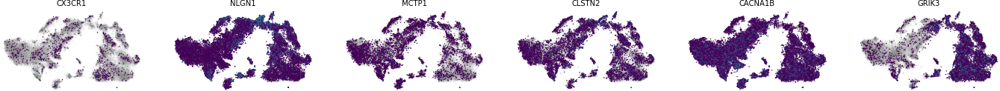

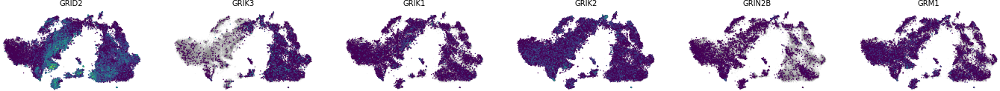

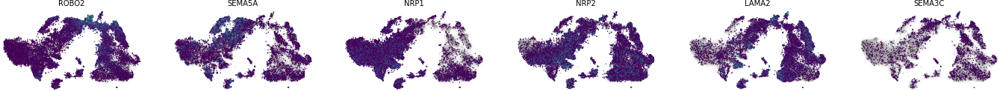

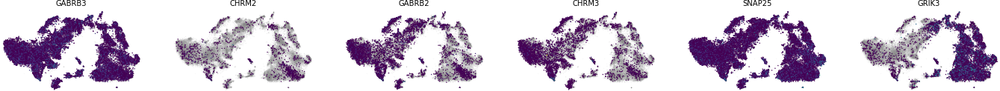

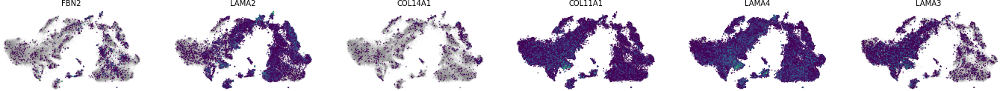

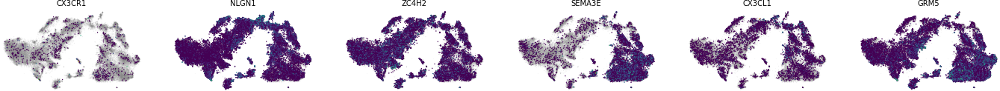

In [34]:
for n in [0, 1, 3, 5, 9, 15]:

    with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

        plt.figure(None, (24, 4))
        gs = plt.GridSpec(1, 6)

        to_plot = df.loc[n, 'overlapping_genes'][:6]

        for i, g in enumerate(to_plot):
            ax = plt.subplot(gs[i])
            exp = np.log2(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1)
            cells = exp > 0

            plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.05, s=2, lw=0, rasterized=True)
            plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=2, lw=0, rasterized=True, cmap='viridis')

            ax.set_aspect('equal')
            
            plt.title(g, fontsize=10)
            plt.axis('off')
            plt.margins(0.02, 0.02)
        
        # plt.savefig(f'/home/kimberly/figures/figure5/opc_overlapping_genes_{n}.pdf', dpi=300)

# Clusters

In [25]:
with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/Pool.loom', 'r') as ds:
    cell_dict = dict(zip(ds.ca.CellID, ds.ca.Clusters))

with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/Pool.agg.loom', 'r') as ds:
    ordering = hc.leaves_list(ds.attrs.euclidean_linkage)
    cluster_dict = dict(zip(ordering, ds.ca.Clusters))   

155025
13


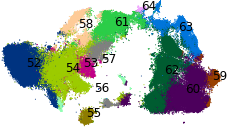

In [26]:
plt.figure(None, (4, 4))
ax = plt.subplot(111)

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:
    labels = np.array([cell_dict.get(x) for x in ds.ca.CellID])

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

    print(ds.shape[1])
    print(ds.ca.Clusters.max() + 1)
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colorize(labels[cells]), s=1, lw=0, rasterized=True)
    
    for c in np.unique(labels):
        mean = ds.ca.TSNE[labels == c].mean(axis=0)
        ax.text(mean[0], mean[1], cluster_dict[c], fontsize=12)
    
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')

In [28]:
with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:
    print(
        dict(zip(ds.ca.Clusters, [cluster_dict.get(x) for x in labels]))
    )

{0: 52, 1: 53, 2: 54, 3: 55, 4: 61, 5: 58, 6: 57, 7: 56, 8: 64, 9: 63, 10: 62, 11: 60, 12: 59}


155025
13


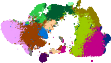

In [14]:
plt.figure(None, (2, 2))
ax = plt.subplot(111)

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

    print(ds.shape[1])

    labels = ds.ca.Clusters
    print(ds.ca.Clusters.max() + 1)
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colorize(labels[cells]), s=1, lw=0, rasterized=True)
    
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    
    plt.savefig(f'{figure_folder}/astrocyte_clusters.pdf', dpi=300)

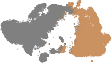

In [11]:
plt.figure(None, (2, 2))
ax = plt.subplot(111)

with loompy.connect(folder + 'harmony_B_C_Clean.agg.loom', 'r') as ds:
    clades = hc.cut_tree(ds.attrs.linkage, 2).flatten()

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

    labels = clades[ds.ca.Clusters]
    colors = np.array(['grey' if x==0 else cbl[5] for x in labels])
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colors[cells], s=1, lw=0, rasterized=True)

    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    
    plt.savefig(f'{figure_folder}/astrocyte_type.pdf', dpi=300)

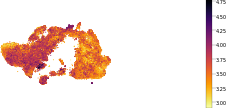

In [14]:
plt.figure(None, (4, 2))

with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
    ax = plt.subplot(121)
    
    # color by top group
    labels = np.log10(ds.ca.TotalUMI)
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=labels[cells], s=1, lw=0, rasterized=True, cmap='inferno_r')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    ax.set_aspect('equal')
    
    ax = plt.subplot(122)
    plt.axis('off')
    cbar = plt.colorbar(ax=ax)
    cbar.ax.tick_params(labelsize=5)
    
    plt.subplots_adjust(wspace=0, hspace=0)
        
    plt.savefig(f'{figure_folder}/astrocyte_umi.pdf', dpi=300)

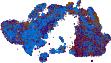

In [13]:
plt.figure(None, (2, 2))
ax = plt.subplot(111)

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

    labels = ds.ca.Donor
    
    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colorize(labels[cells]), s=1, lw=0, rasterized=True)
    
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    
    plt.savefig(f'{figure_folder}/astrocyte_donor.pdf', dpi=300)

# Fibrous

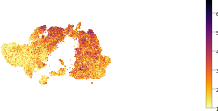

In [15]:
g = 'GFAP'

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (4, 2))
    
    ax = plt.subplot(121)
    
    exp = np.log2(ds[np.where(ds.ra.Gene == g)[0][0], :].flatten() + 1) 
    # exp = exp / np.percentile(exp, 98)
    cells = exp > 0
    
    plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], color='grey', alpha=0.01, s=1, lw=0, rasterized=True)
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap='inferno_r')
    
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')

    ax = plt.subplot(122)
    plt.axis('off')
    cbar = plt.colorbar(ax=ax)
    cbar.ax.tick_params(labelsize=5)
    
    plt.subplots_adjust(wspace=0, hspace=0)

    plt.savefig(f'{figure_folder}/astrocyte_GFAP.pdf', dpi=300)

# Cortical astrocytes 

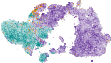

In [18]:
# note make percentile

with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    genes = ["WIF1", "LMO2", "TNC"]
    plt.figure(None, (2, 2))
    ax = plt.subplot(111)
    scatterm(
        ds.ca.TSNE, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=["darkcyan", "darkorange", "rebeccapurple"],
        bgval=0,
        labels=genes,
        rasterized=True,
        s=1,
        legend=None
    )
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    plt.savefig(f'/home/kimberly/figures/figure6/astrocyte_cortical_markers.pdf', dpi=300)

# Region distributions

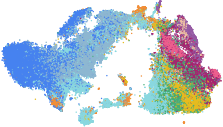

In [19]:
plt.figure(None, (4, 4))
ax = plt.subplot(111)

with loompy.connect(folder + 'Pool.loom', 'r') as ds:
    cell_dict = dict(zip(ds.ca.CellID, ds.ca.ROIGroupCoarse))

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:
    
    roi_group_attr = np.array([cell_dict.get(x) for x in ds.ca.CellID])
    colors = np.array([color_dict[x] for x in roi_group_attr])

    cells = np.random.permutation(ds.shape[1])
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colors[cells], s=2, lw=0, rasterized=True)
    
    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    
    plt.savefig('/home/kimberly/figures/figure6/astrocyte_regions.pdf', dpi=300)

In [20]:
roi_grp_order = [
        'Cerebral cortex',
        'Hippocampus',
        'Claustrum',
        'Basal nuclei',
        'Basal forebrain',
        'Amygdaloid complex',
        'Extended amygdala',
        'Hypothalamus',
        'Thalamus', 
        'Midbrain',
        'Cerebellum',
        'Pons',
        'Myelencephalon',
        'Spinal cord'
    ]

In [ ]:
df = pd.read_csv('roi_group_table.csv')
df.head()

,Unnamed: 0,index,ROI Group,Order,ROI Group Coarse
0,78,Human A13,Cerebral cortex,0,Cerebral cortex
1,81,Human A14,Cerebral cortex,0,Cerebral cortex
2,45,Human A19,Cerebral cortex,0,Cerebral cortex
3,68,Human A1C,Cerebral cortex,0,Cerebral cortex
4,61,Human A23,Cerebral cortex,0,Cerebral cortex


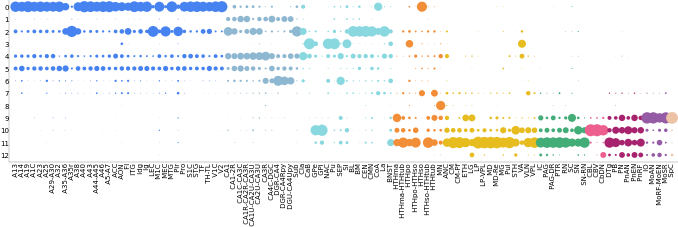

In [23]:
plt.figure(None, (12, 3))
ax = plt.subplot(111)

with loompy.connect(folder + 'harmony_B_C_Clean.loom', 'r') as ds:
        
    # get ROIs and order by ROI Groups
    rois = df['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    total_counts = np.array([(roi_attr == r).sum() for r in rois])
    rois = rois[total_counts > 50]
    total_counts = total_counts[total_counts > 50]
    clusters, labels = np.unique(
        ds.ca.Clusters,
        return_inverse=True
    )
    
    roi_counts = []
    x = []
    y = []
    colors = []
    for i, r in enumerate(rois):
        agg = npg.aggregate(labels, roi_attr == r) / total_counts[i]
        roi_counts.append(agg)
        x.append( [i] * len(clusters) )
        y.append( range(len(clusters)) )
        c = color_dict[df.query('index == @r')['ROI Group Coarse'].values[0]]
        colors = colors + [c] * len(clusters)

    roi_counts = np.hstack(roi_counts)
    x = np.hstack(x)
    y = np.hstack(y)

    plt.scatter(x, y, s=roi_counts * 150, c=colors, rasterized=True, lw=0)
    ax.tick_params(length=0)
    ax.invert_yaxis()
    ax.spines.right.set_visible(False)
    ax.spines.top.set_visible(False)
    plt.xticks(range(len(rois)), pd.Series(rois).str.replace('Human', ''), rotation=90, fontsize=7)
    plt.yticks(range(len(clusters)), clusters, fontsize=7)
    plt.margins(0.01, 0.05)
    
    plt.savefig('/home/kimberly/figures/figure6/astrocyte_region_dot.pdf', dpi=300)

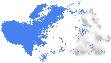

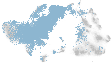

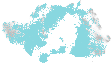

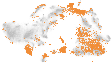

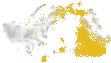

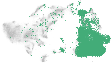

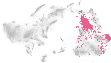

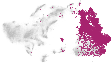

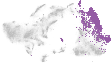

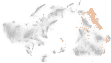

In [158]:
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    roi_group_dict = dict(zip(ds.ca.CellID, ds.ca.ROIGroupCoarse))

with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
    roi_group_coarse = np.array([roi_group_dict.get(x) for x in ds.ca.CellID])
    
    for i, grp in enumerate(df['ROI Group Coarse'].unique()):

        plt.figure(None, (2, 2))
        ax = plt.subplot(111)
        
        cells = roi_group_coarse == grp
        
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.01, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], color=color_dict[grp], s=1, lw=0, rasterized=True)

        ax.set_aspect('equal')
        plt.margins(0.01, 0.01)
        plt.axis('off')
        plt.savefig(f'{figure_folder}/astrocyte_region_{i}_{grp}.pdf', dpi=300)

In [170]:
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    roi_attr = clean_roi(ds.ca.Roi)
    subset = ds.ca.ROIGroupCoarse
    subset[np.isin(ds.ca.ROIGroupFine, ['Amygdaloid complex', 'Extended amygdala'])] = "Amygdala"
    subset[np.isin(ds.ca.ROIGroupFine, ["Basal nuclei"])] = "Basal nuclei"
    subset[np.isin(roi_attr, ['Human MEC', 'Human LEC', 'Human Pir', 'Human A35r'])] = "Rhinal cortex"
    subset[np.isin(roi_attr, ['Human SI'])] = "SI"
    subset[np.isin(roi_attr, ['Human BNST'])] = "BNST"
    subset[np.isin(roi_attr, ['Human SEP'])] = "SEP"
    subset[np.isin(roi_attr, ['Human Cla'])] = "Claustrum"
    subset[np.isin(roi_attr, ['Human GPe', 'Human GPi'])] = "Globus pallidus"
    print(np.unique(subset))
    
    grouping_dict = dict(zip(ds.ca.CellID, subset))

with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
    labels = np.array([grouping_dict.get(x) for x in ds.ca.CellID])
    groups, node_size = np.unique(labels, return_counts=True)
    
    # skeletonize
    overlap = skeletonize(ds.col_graphs.KNN, groups, labels, min_pct=1)

['Amygdala' 'BNST' 'Basal nuclei' 'Cerebellum' 'Cerebral cortex'
 'Claustrum' 'Globus pallidus' 'Hippocampus' 'Hypothalamus' 'Midbrain'
 'Myelencephalon' 'Pons' 'Rhinal cortex' 'SEP' 'SI' 'Spinal cord'
 'Thalamus']


In [174]:
# make graph
G = nx.from_numpy_array(overlap)

# rename nodes
nx.relabel_nodes(
    G, 
    dict(zip(range(len(groups)), groups)),
    copy=False)

# get edge weights and scale
edge_weight = np.divide(
    list(nx.get_edge_attributes(G, 'weight').values()), 
    2
)

# color nodes based on ROI group
with loompy.connect(f"{folder}/Pool.loom", "r") as ds:
    roi_group_dict = dict(zip(subset, ds.ca.ROIGroupCoarse))
roi_group_coarse = np.array([roi_group_dict.get(x) for x in groups])
node_color = [color_dict[r] for r in roi_group_coarse]

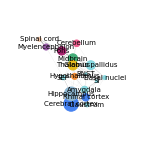

In [181]:
plt.figure(None, (2, 2))
nx.draw(G, node_size=node_size / 150, with_labels=True, font_size=7, width=edge_weight, node_color=node_color)
plt.margins(0.5, 0.5)
plt.tight_layout()
plt.savefig(f'{figure_folder}/astrocyte_region_graph.pdf', dpi=300)

# Specific clusters

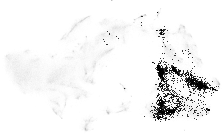

In [74]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (4, 4))
    ax = plt.subplot(111)

    cells = (ds.ca.Roi == 'Human SN') & (ds.ca.Donor == 'H18.30.002')

    plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.01, s=1, lw=0, rasterized=True)
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], color='black', s=1, lw=0, rasterized=True)

    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    plt.title(r, fontsize=0.5)

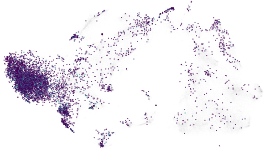

In [75]:
plt.figure(None, (4, 4))
ax = plt.subplot(111)

with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

    ix = np.where(ds.ra.Gene == 'HGF')[0][0]
    exp = np.log2(ds[ix, :].flatten() + 1)
    cells = exp > 0
    plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=1, alpha=0.01, lw=0, rasterized=True, cmap="viridis")
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap="viridis")
    plt.margins(0.01, 0.01)
    plt.axis('off')

    ax.set_aspect('equal')

    plt.tight_layout()
    plt.show()

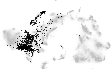

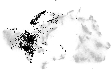

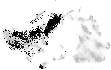

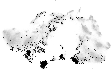

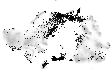

...

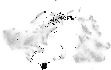

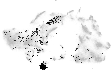

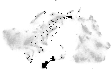

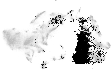

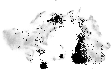

In [56]:
for r in ['LEC', 'MEC', 'Cla', 'SI', 'SEP', 'BNST', 'CaB', 'Pu', 'NAC', 'GPi', 'GPe']:
    
    with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
        plt.figure(None, (2, 2))
        ax = plt.subplot(111)
        
        cells = ds.ca.Roi == 'Human ' + r
        
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.01, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], color='black', s=1, lw=0, rasterized=True)

        ax.set_aspect('equal')
        plt.margins(0.01, 0.01)
        plt.axis('off')
        plt.title(r, fontsize=0.5)
        
        plt.savefig(f'{figure_folder}/astrocyte_roi_{r}.pdf', dpi=300)

['Human BL' 'Human BM' 'Human CEN' 'Human CMN' 'Human CoA' 'Human La']


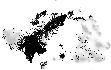

In [59]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (2, 2))
    ax = plt.subplot(111)

    cells = pd.Series(ds.ca.Tissue).str.contains('Amygdaloid').to_numpy()
    print(np.unique(ds.ca.Roi[cells]))

    plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.01, s=1, lw=0, rasterized=True)
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], color='black', s=1, lw=0, rasterized=True)

    ax.set_aspect('equal')
    plt.margins(0.01, 0.01)
    plt.axis('off')
    plt.title(r, fontsize=0.5)

    plt.savefig(f'{figure_folder}/astrocyte_roi_amygdala.pdf', dpi=300)

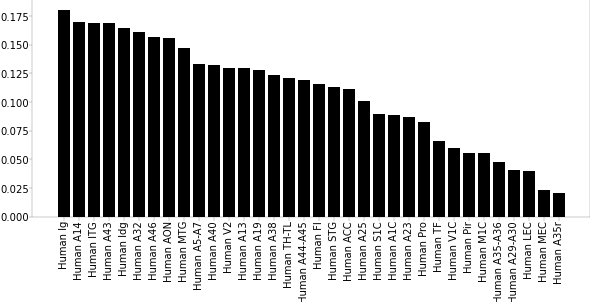

In [96]:
with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

    ix = np.where(ds.ra.Gene == 'HGF')[0][0]
    exp = np.log2(ds[ix, :].flatten() + 1)
    
    rois = df[df['ROI Group'] == 'Cerebral cortex']['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    
    agg = np.array([((exp > 0) & (roi_attr == r)).sum() / (roi_attr == r).sum() for r in rois])
    
    order = np.argsort(agg)[::-1]
    rois = rois[order]
    agg = agg[order]
    
    plt.figure(None, (10, 4))
    plt.bar(rois, agg, color='black')
    plt.xticks(rotation=90)
    plt.show()

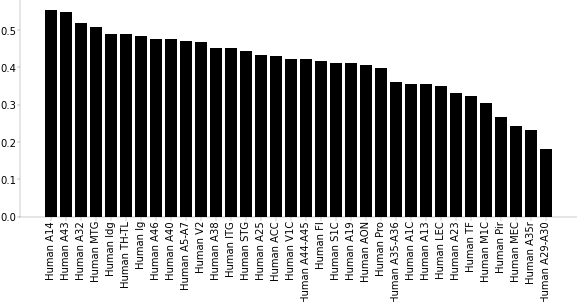

In [114]:
with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

    ix = np.where(ds.ra.Gene == 'DGKZ')[0][0]
    exp = np.log2(ds[ix, :].flatten() + 1)
    
    rois = df[df['ROI Group'] == 'Cerebral cortex']['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    
    agg = np.array([((exp > 0) & (roi_attr == r)).sum() / (roi_attr == r).sum() for r in rois])
    
    order = np.argsort(agg)[::-1]
    rois = rois[order]
    agg = agg[order]
    
    plt.figure(None, (10, 4))
    plt.bar(rois, agg, color='black')
    plt.xticks(rotation=90)
    plt.show()

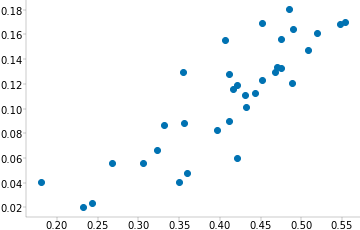

In [106]:
with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

    g1, g2 = 'DGKZ', 'HGF'
    
    ix = np.where(ds.ra.Gene == g1)[0][0]
    exp = np.log2(ds[ix, :].flatten() + 1)
    
    rois = df[df['ROI Group'] == 'Cerebral cortex']['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    
    agg1 = np.array([((exp > 0) & (roi_attr == r)).sum() / (roi_attr == r).sum() for r in rois])
    
    ix = np.where(ds.ra.Gene == g2)[0][0]
    exp = np.log2(ds[ix, :].flatten() + 1)
    
    rois = df[df['ROI Group'] == 'Cerebral cortex']['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    
    agg2 = np.array([((exp > 0) & (roi_attr == r)).sum() / (roi_attr == r).sum() for r in rois])
    
    
    plt.scatter(agg1, agg2)

# Enriched genes

In [39]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.agg.loom', 'r') as ds:    
        
    n_labels = ds.ca.Clusters.max() + 1
    n_markers = 5
    excluded = set(
        np.where(
            (ds.ra.Valid == 0) | pd.Series(ds.ra.Gene).isin(ncRNA_genes).to_numpy()
        )[0]
    )

    included = []
    for ix in range(n_labels):
        print(ix)
        enriched = np.argsort(ds.layers["enrichment"][:, ix])[::-1]
        n = 0
        count = 0
        while count < n_markers:
            if enriched[n] in excluded:
                n += 1
                continue
            included.append(enriched[n])
            excluded.add(enriched[n])
            n += 1
            count += 1
            
    markers = np.array(included)

0
1
2
3
4
5
6
7
8
9
10
11
12


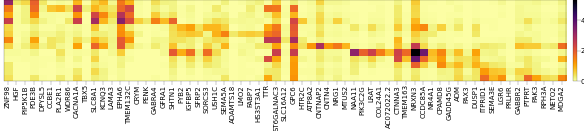

In [55]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.agg.loom', 'r') as ds:
    
    plt.figure(None, (12, 1.5))
    data = np.vstack([ds[ix, :] for ix in markers])
    data = np.log2(data + 1)
    plt.imshow(data.T, aspect='auto', interpolation='none', cmap='inferno_r')
    plt.xticks(range(len(markers)), ds.ra.Gene[markers], rotation='vertical', fontsize=7)
    plt.margins(0, 0)
    plt.yticks([])
    cbar = plt.colorbar(pad=0.01)
    cbar.ax.tick_params(labelsize=7)
    plt.savefig(f'{figure_folder}/astrocyte_markers.pdf', dpi=300)

In [45]:
colors = colorize(np.arange(data.shape[1]))
# data = np.array([tuple(int(c.lstrip('#')[i:i+2], 16) for i in (0, 2, 4)) for c in colors])
plt.figure(None, (3, 0.25))
plt.imshow(np.expand_dims(colors, axis=0), aspect='auto', interpolation='none')
plt.axis('off')
plt.savefig(f'{figure_folder}/astrocyte_cluster_bar.pdf', dpi=300)

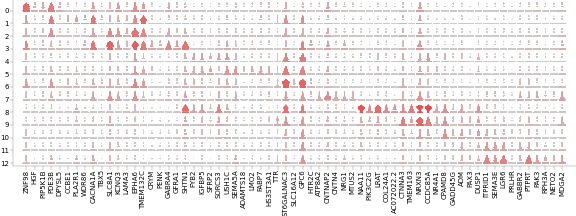

In [96]:
GrayRed = matplotlib.colors.LinearSegmentedColormap.from_list("GrayRed", [(0.8,0.8,0.8), "red",])

with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    genes = ds.ra.Gene[markers]
    
    unique_clusters = np.unique(ds.ca.Clusters)
    
    plt.figure(figsize = (8, 3), tight_layout = {'pad': 0})
    
    for i, gn in enumerate(genes):
        for clust in unique_clusters:
            expression = ds[ds.ra.Gene == gn, :][:, ds.ca.Clusters == clust]
            expression_log = np.log(expression + 1)
            scale_gn = np.percentile(expression_log, 98)
            expression_log = expression_log / np.maximum(scale_gn, 1)
            plot_color = np.array(GrayRed(np.mean(expression_log))).reshape((1, -1))
            expression_log = np.clip(expression_log, 0, 1.2)
            number_in_bins, limit_bins = np.histogram(expression_log, np.linspace(0,1.21,13))
            category_bins = np.digitize(expression_log, limit_bins, right=False) - 1

            f_in_bins = number_in_bins / number_in_bins.sum()
            widths = np.clip(0.35 * f_in_bins[category_bins]/ (0.9*f_in_bins.max()), 0, 0.35)
            rand_y_coord = np.random.uniform(i - widths, i + widths)

            x_coord = clust - (expression_log * 0.5)
            plt.scatter(rand_y_coord, x_coord, c=plot_color, alpha=0.8, s=0.75, edgecolors='none', rasterized=True)

    plt.margins(0.02, 0.02)
    plt.yticks(np.arange(len(unique_clusters)), fontsize=7)
    plt.xticks(np.arange(len(genes)), genes, rotation='vertical', fontsize=7)
    plt.gca().invert_yaxis()
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)
    # plt.savefig(f'{figure_folder}/astrocyte_markers.pdf', dpi=300)

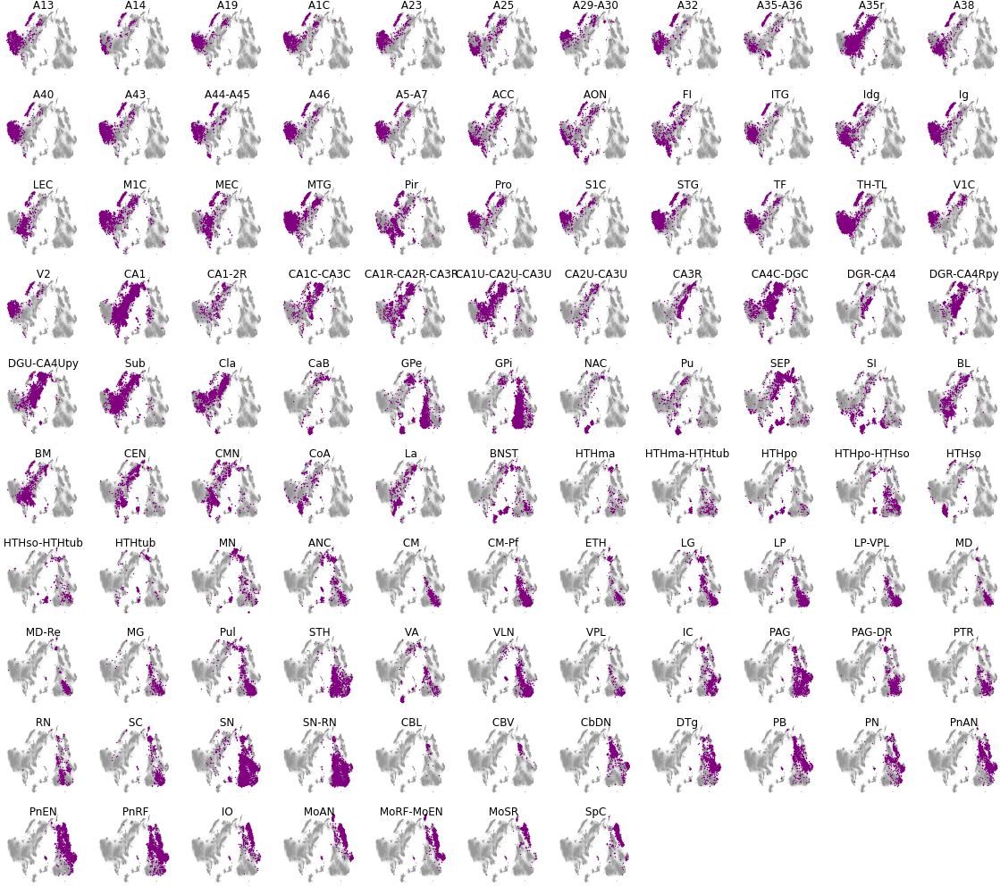

In [112]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (10, 10), dpi=144)
    gs = plt.GridSpec(11, 11)
    
    rois = df['index'].to_numpy()
    roi_attr = clean_roi(ds.ca.Roi)
    
    for i, g in enumerate(rois):
        plt.subplot(gs[i])
        cells = roi_attr == g
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.02, s=0.5, lw=0)
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c='purple', s=0.5, lw=0)
        plt.axis('off')
        plt.title(g[5:], y=0.8, fontsize=6)
        # plt.margins(0, 0)

## Plot astrocytes, OPCs, and oligodendrocytes together

In [1249]:
def prepare_dot_plot(grps, grp_attr, agg_labels, start=0):
    
    # get total counts for each group
    total_counts = np.array([(grp_attr == g).sum() for g in grps])
    # attribute to aggregate by, e.g. clusters
    n_labels = len(np.unique(agg_labels))

    x = []
    y = []
    counts = []
    for i, g in enumerate(grps):
        agg = npg.aggregate(agg_labels, grp_attr == g, func='sum') / total_counts[i]
        counts.append(agg)
        x.append( [i] * n_labels )
        y.append( range(start, n_labels + start) )

    counts = np.hstack(counts)
    x = np.hstack(x)
    y = np.hstack(y)
    
    return x, y, counts

In [1253]:
folder = '/proj/human_adult/20220222/harmony/paris_top/data'

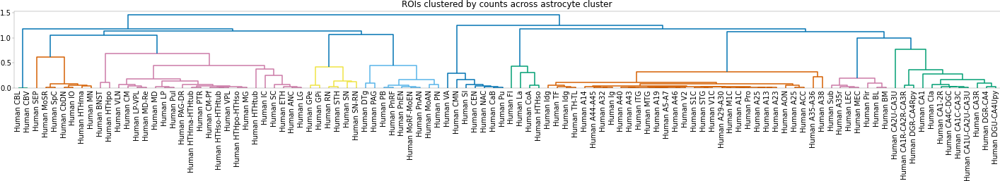

In [1254]:
# first get order from astrocytes
subset = 'B_A'
with loompy.connect(f'{folder}/harmony_{subset}.loom', 'r') as ds:
    rois = np.unique(ds.ca.Roi)
    x, y, counts = prepare_dot_plot(rois, ds.ca.Roi, ds.ca.Clusters)

X = counts.reshape(len(rois), y.max() + 1)
D = pdist(X, 'correlation')
Z = hc.linkage(D, 'complete')
order = hc.leaves_list(Z)
ordered_rois = rois[order]

# plot order
plt.figure(None, (25, 2))
hc.dendrogram(Z, color_threshold=0.8, labels=rois)
plt.xticks(fontsize=10)
plt.title('ROIs clustered by counts across astrocyte cluster')
plt.show()

In [1255]:
x_dict = {}
y_dict = {}
counts_dict = {}

type_dict = {
    "B_A": [range(1,5), range(7, 14)],
    "B_D": [[3], [4]],
    "B_B": [range(1, 3), range(3, 8)]
}

start = 0

for subset in ["B_A", "B_D", "B_B"]:
          
    with loompy.connect(f'{folder}/harmony_{subset}.loom', 'r') as ds:
                    
        type_grps = type_dict[subset]
        type_attr = np.array([-1] * ds.shape[1])
        type_attr[np.isin(ds.ca.Clusters, type_grps[0])] = 0
        type_attr[np.isin(ds.ca.Clusters, type_grps[1])] = 1
        cells = type_attr >= 0
        type_attr = type_attr[cells]
        roi_attr = ds.ca.Roi[cells]
        
        
        x_dict[subset], y_dict[subset], counts_dict[subset] = prepare_dot_plot(ordered_rois, roi_attr, type_attr, start=start)
        
        start += 2

In [1256]:
x = np.hstack([x_dict[n] for n in ["B_A", "B_D", "B_B"]])
y = np.hstack([y_dict[n] for n in ["B_A", "B_D", "B_B"]])
counts = np.hstack([counts_dict[n] for n in ["B_A", "B_D", "B_B"]])
y_labels = ['-'.join([x, str(n)]) for x in ["Astro", "OPC", "Oligo"] for n in range(2)]
y_labels

['Astro-0', 'Astro-1', 'OPC-0', 'OPC-1', 'Oligo-0', 'Oligo-1']

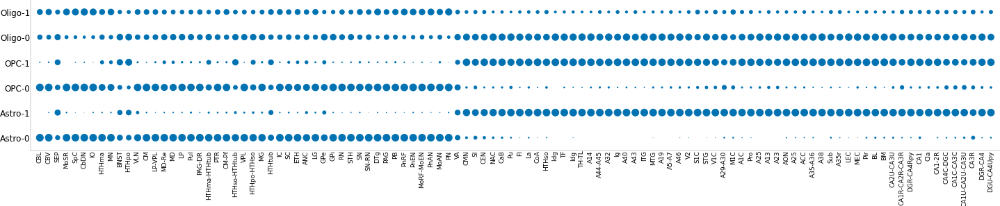

In [1257]:
plt.figure(None, (25, 4))
ax = plt.subplot(111)
scale = 100
plt.scatter(x, y, s=counts * scale)
ax.tick_params(length=0)
plt.xticks(
    range(len(ordered_rois)), 
    pd.Series(ordered_rois).str.replace('Human ', ''), 
    rotation=90,
    fontsize=9
)
plt.yticks(
    range(len(y_labels)),
    y_labels,
    fontsize=12
)
plt.margins(0.01, 0.1)

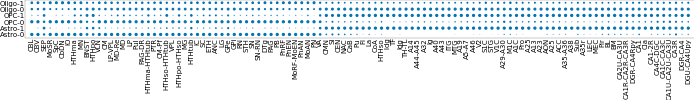

In [1261]:
plt.figure(None, (12, 0.70))
ax = plt.subplot(111)
scale = 5
plt.scatter(x, y, s=counts * scale)
ax.tick_params(length=0)
plt.xticks(
    range(len(ordered_rois)), 
    pd.Series(ordered_rois).str.replace('Human ', ''), 
    rotation=90,
    fontsize=7
)
plt.yticks(
    range(len(y_labels)),
    y_labels,
    fontsize=7
)
plt.margins(0.01, 0.1)
plt.savefig('/home/kimberly/figures/glial_roi_dot_plot.pdf', dpi=300)

DE genes

NameError: name 'cluster_names' is not defined

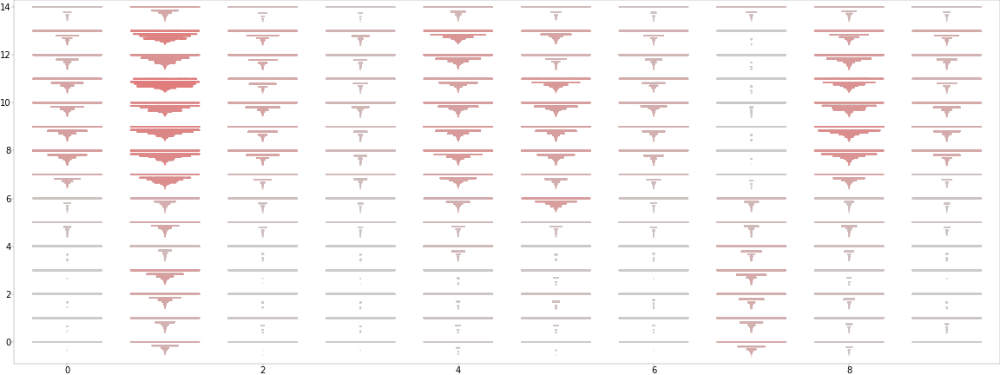

In [1267]:
GrayRed = mpl.colors.LinearSegmentedColormap.from_list("GrayRed", [(0.8,0.8,0.8), "red",])

subset = 'B_A'

with loompy.connect(f'{folder}/harmony_{subset}.loom', 'r') as ds:

    genes = ['LHX2', 'NCAN', 'FOXG1', 'LINC01551', 'EMID1', 'CSPG5', 'FOXG1-AS1', 'CRNDE', 'EMX2OS', 'AL049777.1']
    
    unique_clusters = np.unique(ds.ca.Clusters)
    
    plt.figure(figsize = (16, 6), tight_layout = {'pad': 0})
    
    for i, gn in enumerate(genes):
        for clust in unique_clusters:
            expression = ds[:, ds.ca.Clusters == clust][ds.ra.Gene == gn, :]
            expression_log = np.log(expression + 1)
            scale_gn = np.percentile(expression_log, 99.8)
            expression_log = expression_log / np.maximum(scale_gn, 1)
            plot_color = np.array(GrayRed(np.mean(expression_log))).reshape((1, -1))
            expression_log = np.clip(expression_log, 0, 1.2)
            number_in_bins, limit_bins = np.histogram(expression_log, np.linspace(0,1.21,13))
            category_bins = np.digitize(expression_log, limit_bins, right=False) - 1

            f_in_bins = number_in_bins / number_in_bins.sum()
            widths = np.clip(0.35 * f_in_bins[category_bins]/ (0.9*f_in_bins.max()), 0, 0.35)
            rand_y_coord = np.random.uniform(i - widths, i + widths)

            x_coord = clust - (expression_log * 0.5)
            plt.scatter(rand_y_coord, x_coord, c=plot_color, alpha=0.5, s=3, edgecolors='none', rasterized=True)

    plt.margins(0.02, 0.02)
    plt.yticks(np.arange(len(unique_clusters)))
    plt.xticks(np.arange(len(genes)), genes, rotation='vertical')
    plt.gca().invert_yaxis()
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['top'].set_visible(False)

In [ ]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
    cells = astrocyte_type == 0
    
    labels = KMeans(n_clusters=20, random_state=0).fit_predict(ds.ca.PCA[cells])
    
    plt.figure(None, (5, 5))
    plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=colorize(labels), s=1, lw=0, rasterized=True)
    plt.axis('off')
    plt.show()
    
    gene_names = ds.ra.Gene[ds.ra.Valid == 1]
    
    gfap = ds[ds.ra.Gene == 'GFAP', :].flatten()[cells]
    print('loading data')
    # data = ds[:, cells][ds.ra.Valid == 1, :]
    print('tiling')
    # gfap = np.tile(gfap, data.shape[1]).reshape(data.shape[1], len(gfap))
    print('correlation')
    temp = np.corrcoef(gfap.astype('float16'), data.astype('float16'), dtype='float3')

#### Similarities across regions

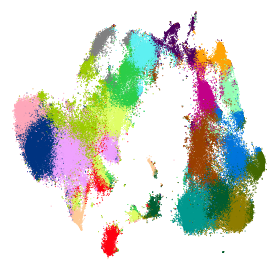

In [9]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    
    labels = KMeans(n_clusters=20, random_state=0).fit_predict(ds.ca.PCA)
    
    plt.figure(None, (5, 5))
    plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c=colorize(labels), s=1, lw=0, rasterized=True)
    plt.axis('off')
    plt.show()

In [11]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    means = npg.aggregate(labels, ds[ds.ra.Selected == 1, :], func='mean')

ValueError: a must be scalar or 1 dimensional, use .ravel to flatten. Alternatively specify axis.

In [8]:
plt.figure(None, (6, 5))
plt.imshow(np.corrcoef(data, data)[:12, :12], cmap='jet')
plt.xticks(range(data.shape[0]), clusters)
plt.yticks(range(data.shape[0]), clusters)
plt.colorbar()
plt.show()

MemoryError: Unable to allocate 716. GiB for an array with shape (310050, 310050) and data type float64

<Figure size 432x360 with 0 Axes>

# Gene expression

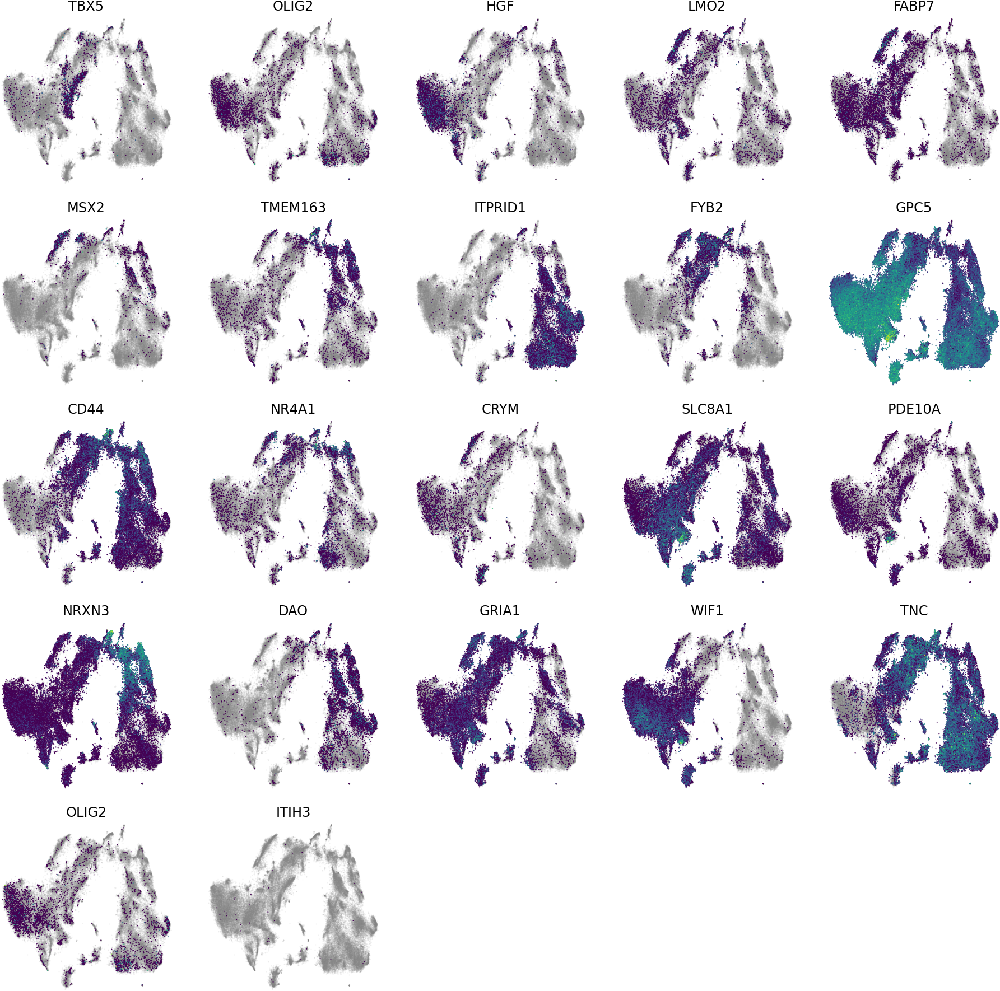

In [279]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (16, 16), dpi=144)
    gs = plt.GridSpec(5, 5)
    
    genes_to_plot = ["TBX5", "OLIG2", "HGF", "LMO2", "FABP7", "MSX2", "TMEM163", "ITPRID1", "FYB2", "GPC5", "CD44",
                    "NR4A1", "CRYM", "SLC8A1", "PDE10A", "NRXN3", "DAO", "GRIA1", "WIF1", "TNC", "OLIG2", "ITIH3"]
    
    for i, g in enumerate(genes_to_plot):
        plt.subplot(gs[i])
        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log(ds[ix, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.1, s=1, lw=0, rasterized=True)
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True)
        plt.axis('off')
        plt.title(g)
        plt.margins(0.01, 0.01)

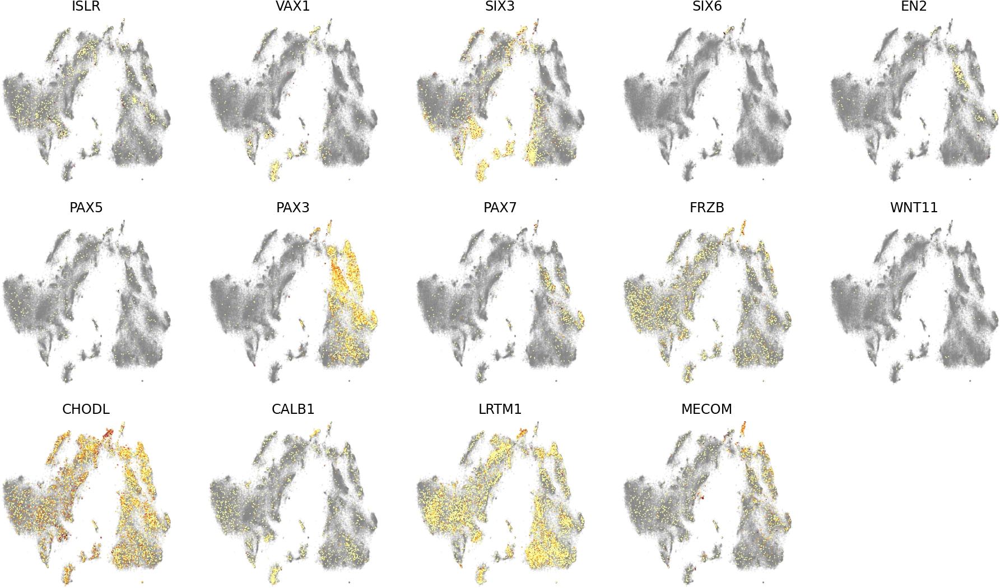

In [67]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (16, 16), dpi=144)
    gs = plt.GridSpec(5, 5)
    
    genes_to_plot = ["ISLR", "VAX1", "SIX3", "SIX6", "EN2", "PAX5", "PAX3", "PAX7", 
                    "FRZB", "WNT11", "CHODL", "CALB1", "LRTM1", "MECOM"]
    
    for i, g in enumerate(genes_to_plot):
        plt.subplot(gs[i])
        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log(ds[ix, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.1, s=1, lw=0, rasterized=True, cmap='inferno_r')
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title(g)
        plt.margins(0.01, 0.01)

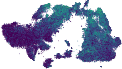

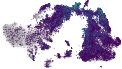

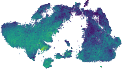

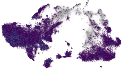

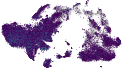

In [248]:
for g in ['GFAP', "CD44", "GPC5", "SLC13A5", "DIO2"]:

    plt.figure(None, (2, 2))
    ax = plt.subplot(111)

    with loompy.connect('/proj/human_adult/20220222/harmony/paris_top_bug/data/harmony_B_C_Clean.loom', 'r') as ds:

        exp = np.log2(ds[ds.ra.Gene == g, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=0.5, alpha=0.03, lw=0, rasterized=True, cmap="viridis")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=0.5, lw=0, rasterized=True, cmap="viridis")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.savefig(f'/home/kimberly/figures/figure6/tsne_{g}.pdf', dpi=300)

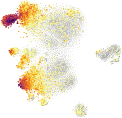

In [62]:
for g in ['Gfap']:

    plt.figure(None, (2, 2))
    ax = plt.subplot(111)

    with loompy.connect('/proj/human_adult/20220222/harmony/analysis/data/mouse_astrocytes.loom', 'r') as ds:

        exp = np.log2(ds[ds.ra.Gene == g, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', s=1, alpha=0.1, lw=0, rasterized=True, cmap="inferno_r")
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=1, lw=0, rasterized=True, cmap="inferno_r")
        plt.margins(0.01, 0.01)
        plt.axis('off')
        
        ax.set_aspect('equal')
        
        plt.tight_layout()
        plt.savefig(f'/home/kimberly/figures/figure6/mouse_tsne_{g}.pdf', dpi=300)

Mon Aug  1 20:41:37 2022 INFO maxp pruned
Mon Aug  1 20:41:37 2022 INFO cmap pruned
Mon Aug  1 20:41:37 2022 INFO kern dropped
Mon Aug  1 20:41:37 2022 INFO post pruned
Mon Aug  1 20:41:37 2022 INFO FFTM dropped
Mon Aug  1 20:41:37 2022 INFO GPOS pruned
Mon Aug  1 20:41:37 2022 INFO GSUB pruned
Mon Aug  1 20:41:37 2022 INFO name pruned
Mon Aug  1 20:41:37 2022 INFO glyf pruned
Mon Aug  1 20:41:37 2022 INFO Added gid0 to subset
Mon Aug  1 20:41:37 2022 INFO Added first four glyphs to subset
Mon Aug  1 20:41:37 2022 INFO Closing glyph list over 'GSUB': 15 glyphs before
Mon Aug  1 20:41:37 2022 INFO Glyph names: ['.notdef', '.null', 'C', 'F', 'I', 'L', 'M', 'N', 'O', 'T', 'W', 'nonmarkingreturn', 'one', 'space', 'two']
Mon Aug  1 20:41:37 2022 INFO Glyph IDs:   [0, 1, 2, 3, 20, 21, 38, 41, 44, 47, 48, 49, 50, 55, 58]
Mon Aug  1 20:41:37 2022 INFO Closed glyph list over 'GSUB': 15 glyphs after
Mon Aug  1 20:41:37 2022 INFO Glyph names: ['.notdef', '.null', 'C', 'F', 'I', 'L', 'M', 'N', 'O'

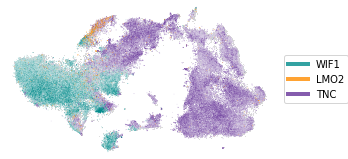

In [277]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    genes = ["WIF1", "LMO2", "TNC"]
    plt.figure(None, (5, 5))
    ax = plt.subplot(111)
    scatterm(
        ds.ca.TSNE, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=["darkcyan", "darkorange", "rebeccapurple", "green", "brown", "hotpink", "yellow"],
        bgval=0,
        labels=genes,
        max_percentile=99,
        rasterized=True, 
    )
    plt.axis('off')
    ax.set_aspect('equal')
    plt.savefig(f'/home/kimberly/figures/figure6/tsne_multiple_genes_type1.pdf', dpi=300)
    plt.show()

Thu Jul 28 21:26:51 2022 INFO maxp pruned
Thu Jul 28 21:26:51 2022 INFO cmap pruned
Thu Jul 28 21:26:51 2022 INFO kern dropped
Thu Jul 28 21:26:51 2022 INFO post pruned
Thu Jul 28 21:26:51 2022 INFO FFTM dropped
Thu Jul 28 21:26:51 2022 INFO GPOS pruned
Thu Jul 28 21:26:51 2022 INFO GSUB pruned
Thu Jul 28 21:26:51 2022 INFO name pruned
Thu Jul 28 21:26:51 2022 INFO glyf pruned
Thu Jul 28 21:26:51 2022 INFO Added gid0 to subset
Thu Jul 28 21:26:51 2022 INFO Added first four glyphs to subset
Thu Jul 28 21:26:51 2022 INFO Closing glyph list over 'GSUB': 17 glyphs before
Thu Jul 28 21:26:51 2022 INFO Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'G', 'L', 'N', 'P', 'T', 'V', 'five', 'four', 'nonmarkingreturn', 'space', 'three']
Thu Jul 28 21:26:51 2022 INFO Glyph IDs:   [0, 1, 2, 3, 22, 23, 24, 36, 37, 38, 39, 42, 47, 49, 51, 55, 57]
Thu Jul 28 21:26:51 2022 INFO Closed glyph list over 'GSUB': 17 glyphs after
Thu Jul 28 21:26:51 2022 INFO Glyph names: ['.notdef', '.null', 'A', 'B',

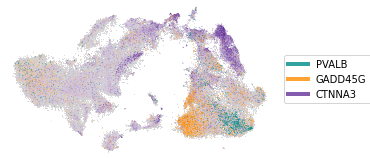

In [208]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    genes = ["PVALB", "GADD45G", "CTNNA3"]
    plt.figure(None, (5, 5))
    ax = plt.subplot(111)
    scatterm(
        ds.ca.TSNE, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=["darkcyan", "darkorange", "rebeccapurple", "green", "brown", "hotpink", "yellow"],
        bgval=0,
        labels=genes,
        max_percentile=99,
        rasterized=True, 
    )
    plt.axis('off')
    ax.set_aspect('equal')
    plt.savefig(f'/home/kimberly/figures/figure6/tsne_multiple_genes_type2.pdf', dpi=300)
    plt.show()

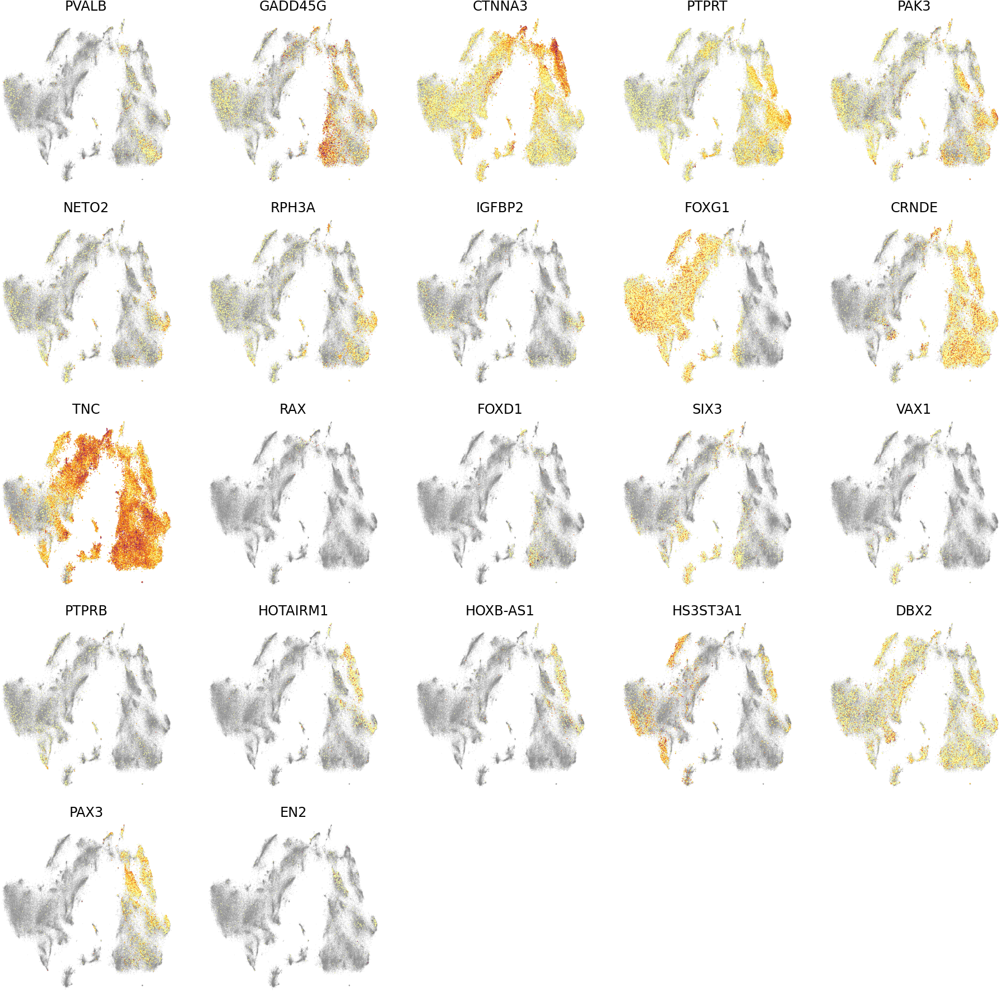

In [265]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:

    plt.figure(None, (16, 16), dpi=144)
    gs = plt.GridSpec(5, 5)
    
    genes_to_plot = ["PVALB", "GADD45G", "CTNNA3", "PTPRT", "PAK3", "NETO2", "RPH3A", "IGFBP2", "FOXG1", "CRNDE", "TNC",
                    "RAX", "FOXD1", "SIX3", "VAX1", "PTPRB", "HOTAIRM1", "HOXB-AS1", "HS3ST3A1", "DBX2", "PAX3", "EN2"]
    
    for i, g in enumerate(genes_to_plot):
        plt.subplot(gs[i])
        ix = np.where(ds.ra.Gene == g)[0][0]
        exp = np.log(ds[ix, :].flatten() + 1)
        cells = exp > 0
        plt.scatter(ds.ca.TSNE[:, 0], ds.ca.TSNE[:, 1], c='grey', alpha=0.1, s=0.5, lw=0, rasterized=True, cmap='inferno_r')
        plt.scatter(ds.ca.TSNE[cells, 0], ds.ca.TSNE[cells, 1], c=exp[cells], s=0.5, lw=0, rasterized=True, cmap='inferno_r')
        plt.axis('off')
        plt.title(g)
        plt.margins(0.01, 0.01)

In [ ]:
color_dict

{'Cerebral cortex': '#4682f0',
 'Hippocampus': '#8eb7d1',
 'Cerebral nuclei': '#89d8e0',
 'Hypothalamus': '#f28e37',
 'Thalamus': '#e7bc1f',
 'Midbrain': '#43ad78',
 'Pons': '#a7236e',
 'Cerebellum': '#ed5f8e',
 'Myelencephalon': '#955ba5',
 'Spinal cord': '#eec2a4'}

ValueError: Unknown color or colormap #8eb7d1

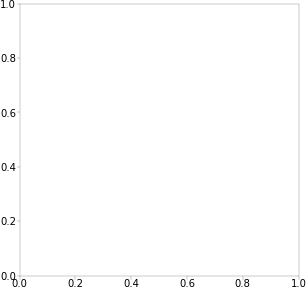

In [ ]:
with loompy.connect(f'{folder}/harmony_B_C_Clean.loom', 'r') as ds:
    genes = ["TBX5", "PENK", "LMO2", "HOTAIRM1", "HGF", "GADD45G", "OTX2"]
    plt.figure(None, (5, 5))
    ax = plt.subplot(111)
    scatterm(
        ds.ca.TSNE, 
        c=[np.log2(ds[ds.ra.Gene == g, :].flatten() + 1) for g in genes],
        cmaps=["#8eb7d1", "darkorange", "rebeccapurple", "green", "brown", "hotpink", "yellow"],
        bgval=0,
        labels=genes,
        max_percentile=99,
        rasterized=True, 
    )
    plt.axis('off')
    ax.set_aspect('equal')
    plt.savefig(f'/home/kimberly/figures/figure6/tsne_multiple_genes.pdf', dpi=300)

# White matter score

In [344]:
roi_grp_order

['Cerebral cortex',
 'Hippocampus',
 'Claustrum',
 'Basal nuclei',
 'Basal forebrain',
 'Amygdaloid complex',
 'Extended amygdala',
 'Hypothalamus',
 'Thalamus',
 'Midbrain',
 'Cerebellum',
 'Pons',
 'Myelencephalon',
 'Spinal cord']

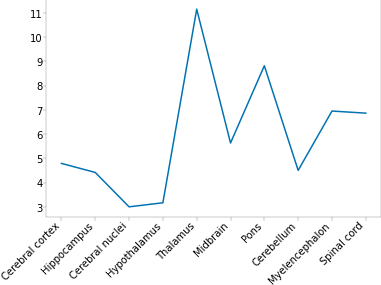

In [355]:
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    ratios = []
    for r in list(color_dict.keys()):
        cells = ds.ca.ROIGroupCoarse == r
        mgl = (ds.ca.Punchcard[cells] == 'harmony_B_B_Clean').sum()
        oligo = (ds.ca.Punchcard[cells] == 'harmony_B_A').sum()
        ratios.append(oligo / mgl)
    plt.plot(ratios)
    plt.xticks(range(len(ratios)), list(color_dict.keys()), rotation=45, ha='right')

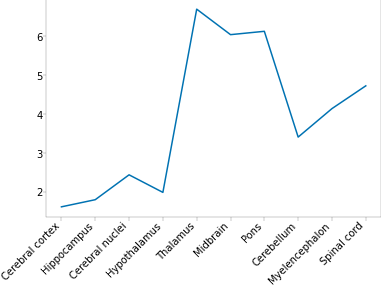

In [354]:
with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    ratios = []
    for r in list(color_dict.keys()):
        cells = ds.ca.ROIGroupCoarse == r
        mgl = (ds.ca.Punchcard[cells] == 'harmony_B_C_Clean').sum()
        oligo = (ds.ca.Punchcard[cells] == 'harmony_B_A').sum()
        ratios.append(oligo / mgl)
    plt.plot(ratios)
    plt.xticks(range(len(ratios)), list(color_dict.keys()), rotation=45, ha='right')

In [410]:
%%time

with loompy.connect(f'{folder}/Pool.loom', 'r') as ds:
    roi_attr = pd.Series(ds.ca.Roi).replace({r'[^\x00-\x7F]+':''}, regex=True).to_numpy()
    roi_attr[ds.ca.ROIGroup != 'Cerebral cortex'] = 'Other'
    cell_dict = dict(zip(ds.ca.CellID, roi_attr))

with loompy.connect(f'{folder}/harmony_A_C_Clean.loom', 'r') as ds:
    
    labels = np.array([cell_dict.get(x) for x in ds.ca.CellID])
    groups, counts = np.unique(labels, return_counts=True)
    print(groups)
    node_size = counts

    min_pct = 1
    
    row = []
    col = []
    weight = []
    nn = ds.col_graphs.KNN
    for i, c1 in enumerate(groups):
        n_c1 = (labels == c1).sum()
        rc1 = labels[nn.row] == c1
        cc1 = labels[nn.col] == c1
        c1_internal = (rc1 & cc1).sum()
        for j, c2 in enumerate(groups):
            n_c2 = (labels == c2).sum()
            rc2 = labels[nn.row] == c2
            cc2 = labels[nn.col] == c2
            c2_internal = (rc2 & cc2).sum()
            c1c2_between = ((rc1 & cc2) | (rc2 & cc1)).sum()
            f = n_c1 / (n_c1 + n_c2)
            expected_fraction = (2 * f - 2 * f**2)
            observed_fraction = c1c2_between / (c1_internal + c2_internal + c1c2_between)
            # if observed_fraction > expected_fraction * (self.min_pct / 100):
            if c1 == 'Other' or c2 == 'Other':
                continue
            if observed_fraction > (min_pct / 100):
                row.append(i)
                col.append(j)
                weight.append(observed_fraction / expected_fraction)
    n_clusters = len(groups)
    overlap = sparse.coo_matrix((weight, (row, col)), shape=(n_clusters, n_clusters)).A
    np.fill_diagonal(overlap, 0)

['Human A13' 'Human A14' 'Human A19' 'Human A1C' 'Human A23' 'Human A25'
 'Human A29-A30' 'Human A32' 'Human A35-A36' 'Human A38' 'Human A40'
 'Human A43' 'Human A44-A45' 'Human A46' 'Human A5-A7' 'Human ACC'
 'Human AON' 'Human FI' 'Human ITG' 'Human Idg' 'Human Ig' 'Human LEC'
 'Human M1C' 'Human MEC' 'Human MTG' 'Human Pir' 'Human Pro' 'Human S1C'
 'Human STG' 'Human TF' 'Human TH-TL' 'Human V1C' 'Human V2' 'Other']
CPU times: user 13min 44s, sys: 12min 54s, total: 26min 38s
Wall time: 26min 38s


In [414]:
backup = np.copy(overlap)
backup.shape

(34, 34)

In [415]:
overlap = overlap[:-1, :-1]
overlap.shape

(33, 33)

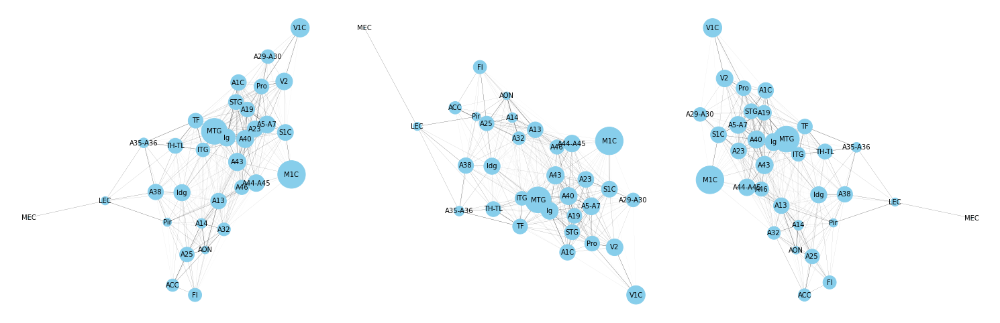

In [420]:
G = nx.from_numpy_array(overlap)
# rename nodes
nx.relabel_nodes(G, dict(zip(range(len(groups) - 1), pd.Series(groups[:-1]).str.replace('Human ', ''))), copy=False)
# get edge weights and scale
edge_weight = np.divide(
    list(nx.get_edge_attributes(G, 'weight').values()), 
    2
)
# color nodes based on ROI group
# node_color = [color_dict[mapping[grp]] for grp in groups]

plt.figure(None, (21, 7))
plt.subplot(131)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.subplot(132)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.subplot(133)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.tight_layout()
plt.show()

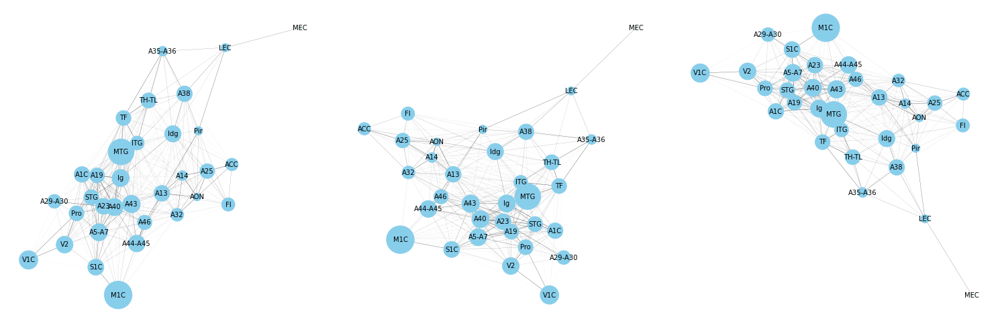

In [421]:
G = nx.from_numpy_array(overlap)
# rename nodes
nx.relabel_nodes(G, dict(zip(range(len(groups) - 1), pd.Series(groups[:-1]).str.replace('Human ', ''))), copy=False)
# get edge weights and scale
edge_weight = np.divide(
    list(nx.get_edge_attributes(G, 'weight').values()), 
    2
)
# color nodes based on ROI group
# node_color = [color_dict[mapping[grp]] for grp in groups]

plt.figure(None, (21, 7))
plt.subplot(131)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.subplot(132)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.subplot(133)
nx.draw(G, node_size=node_size[:-1] / 25, with_labels=True, font_size=10, width=edge_weight, node_color='skyblue')
# plt.margins(0.5, 0.5)
plt.tight_layout()
plt.show()